## Tests of the pre-DR7 code base

The purpose of this notebook is to compare a small number of Tractor catalogs from DR5 against the version of the pipeline we hope to use for DR7.  Some of the major changes include:
* More careful treatment of sources in and around bright stars.
* A source-detection step which uses the coadds to find faint sources.
* Use of Gaia and Tycho2 as (prior) input catalogs.

In [1]:
import os
from glob import glob
import numpy as np
import skimage.io
import fitsio
import matplotlib.pyplot as plt

In [2]:
from astrometry.libkd.spherematch import match_radec
from astropy.table import Table, vstack

In [3]:
plt.style.use('seaborn-talk')
%matplotlib inline

In [4]:
def read_tractor():
    """Read the old and new Tractor catalogs."""
    
    # First read the pre-DR7 catalogs.
    dr7dir = '/global/cscratch1/sd/dstn/dr7-lg'
    dr7files = glob('{}/tractor/???/tractor-*.fits'.format(dr7dir))
    cat = []
    for ii, dr7file in enumerate(dr7files):
        if (ii % 100) == 0:
            print('Read {:03d} / {:03d} pre-DR7 Tractor catalogs.'.format(ii, len(dr7files)))
        cat.append(Table(fitsio.read(dr7file, ext=1, lower=True)))
    dr7 = vstack(cat)
    
    # Now read the corresponding DR5 catalogs.
    dr5dir = '/global/project/projectdirs/cosmo/data/legacysurvey/dr5'
    dr5files = [ff.replace(dr7dir, dr5dir) for ff in dr7files]
    cat = []
    for ii, dr5file in enumerate(dr5files):
        if (ii % 100) == 0:
            print('Read {:03d} / {:03d} DR5 Tractor catalogs.'.format(ii, len(dr5files)))
        cat.append(Table(fitsio.read(dr5file, ext=1, lower=True)))
    dr5 = vstack(cat)
    
    dr5 = dr5[dr5['brick_primary']]
    dr7 = dr7[dr7['brick_primary']]
    
    return dr5, dr7

In [5]:
%time dr5, dr7 = read_tractor()
print('Read {} DR5 and {} pre-DR7 sources.'.format(len(dr5), len(dr7)))

Read 000 / 258 pre-DR7 Tractor catalogs.
Read 100 / 258 pre-DR7 Tractor catalogs.
Read 200 / 258 pre-DR7 Tractor catalogs.
Read 000 / 258 DR5 Tractor catalogs.
Read 100 / 258 DR5 Tractor catalogs.
Read 200 / 258 DR5 Tractor catalogs.
CPU times: user 32 s, sys: 7.63 s, total: 39.6 s
Wall time: 1min 31s
Read 1304120 DR5 and 1468268 pre-DR7 sources.


### What sources are in DR7 but not DR5, and in DR5 but not DR7?
Use a 1 arcsec search radius.

In [6]:
m1, m2, d12 = match_radec(dr7['ra'], dr7['dec'], dr5['ra'], dr5['dec'], 1./3600.0, nearest=True)
in_dr7_not_dr5 = np.delete(np.arange(len(dr7)), m1)
in_dr5_not_dr7 = np.delete(np.arange(len(dr5)), m2)

In [7]:
def qa_radec():
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)
    ax1.hexbin(dr5['ra'], dr5['dec'], mincnt=1)
    ax1.set_title('All DR5 Sources (N={})'.format(len(dr5)))
                  
    ax3.hexbin(dr5['ra'][in_dr5_not_dr7], dr5['dec'][in_dr5_not_dr7], mincnt=1)
    ax3.set_title('In DR5, not DR7 (N={})'.format(len(in_dr5_not_dr7)))
    
    ax2.hexbin(dr7['ra'], dr7['dec'], mincnt=1)
    ax2.set_title('All DR7 Sources (N={})'.format(len(dr7)))
    
    ax4.hexbin(dr7['ra'][in_dr7_not_dr5], dr7['dec'][in_dr7_not_dr5], mincnt=1)
    ax4.set_title('In DR7, not DR5 (N={})'.format(len(in_dr7_not_dr5)))
    
    fig.subplots_adjust(wspace=0.02, hspace=0.2)

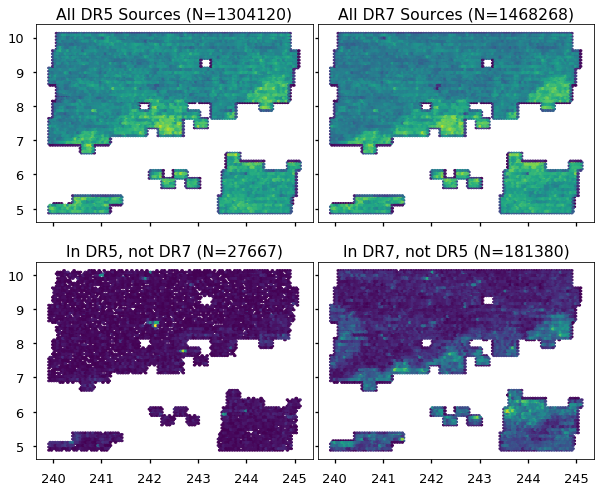

In [8]:
qa_radec()

### Study sources in and around bright stars.

In [9]:
def qa_brightstars(magcut=10):
    istar = np.logical_or(dr7['ref_cat'] == 'T2', dr7['ref_cat'] == 'G2')
    ibright = np.logical_and(istar, dr7['gaia_phot_g_mean_mag'] < magcut)
    instar = dr7['brightstarinblob']
    print('Found {} m<{:.1f} (bright) stars.'.format(np.sum(ibright), magcut))
    print('Found {} sources around all {} Gaia/Tycho-2 stars.'.format(np.sum(instar), np.sum(istar)))

    fig, ax = plt.subplots()
    ax.scatter(dr7['ra'][ibright], dr7['dec'][ibright], s=30, 
               label='Bright Stars (m<{:.1f})'.format(magcut))
    ax.scatter(dr7['ra'][instar], dr7['dec'][instar], s=2, alpha=0.6, 
               label='Sources around All Stars')
    ax.legend(loc='lower left')
    
    print('Sources in and around bright stars have type(s) = {}'.format(', '.join(np.unique(dr7['type'][instar]))))

Found 127 m<10.0 (bright) stars.
Found 17195 sources around all 150087 Gaia/Tycho-2 stars.
Sources in and around bright stars have type(s) = PSF 


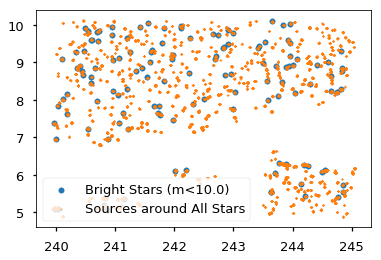

In [10]:
qa_brightstars()

### Study needle galaxies

Look at exponential galaxies with b/a < 0.2 and r>100 arcsec.

In [11]:
def qa_needles(cat, obj='EXP'):
    """Try to identify needles based on their size and ellipticity (or b/a ratio).
    
    """
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 8))
    
    result = []
    
    for objtype in np.atleast_1d(obj):
        if objtype == 'EXP':
            these = (cat['type'] == 'EXP ') * (cat['flux_r'] > 0)
            radius = cat['shapeexp_r'][these]
            e1, e2 = cat['shapeexp_e1'][these], cat['shapeexp_e2'][these]
        elif objtype == 'DEV':
            these = (cat['type'] == 'DEV ') * (cat['flux_r'] > 0)
            radius = cat['shapedev_r'][these]
            e1, e2 = cat['shapedev_e1'][these], cat['shapedev_e2'][these]
        else:
            raise NotImplementedError
            
        ell = np.hypot(e1, e2)
        ba = (1 - ell) / (1 + ell) 
        rmag = 22.5 - 2.5 * np.log10(cat['flux_r'][these])
        result.append( (these, ba, radius, rmag) )
        
        ax1.scatter(rmag, ba, s=3, label=objtype, alpha=0.5)
        ax2.scatter(radius, ba, s=3, label=objtype, alpha=0.5)
        ax3.scatter(rmag, radius, s=3, label=objtype, alpha=0.5)
        
    ax1.set_ylabel('Minor-to-Major Axis Ratio)')
    
    ax2.set_xlabel('Half-light Radius (arcsec)')
    ax2.set_ylabel('Minor-to-Major Axis Ratio)')

    ax3.set_xlabel('r (AB mag)')
    ax3.set_ylabel('Half-light Radius (arcsec)')
    
    ax1.set_xlim(12, 25)
    ax1.set_ylim(0, 1)

    ax2.set_xlim(0, 155)
    ax2.set_ylim(0, 1)
    
    ax3.set_xlim(12, 25)
    ax3.set_ylim(0, 155)
    
    #ax1.legend(loc='upper left')
    ax4.axis('off')
    
    fig.subplots_adjust(wspace=0.2)
    
    return result

In [12]:
def write_viewer_file(cat):
    outfile = os.path.join(os.getenv('HOME'), 'needles-dr7.fits')
    out = Table()
    out['ra'] = cat['ra']
    out['dec'] = cat['dec']
    out['name'] = cat['objid']
    print('Writing {}'.format(outfile))
    out.write(outfile, format='fits', overwrite=True)

In [13]:
def get_needles(dr7):
    these, ba, radius, rmag = qa_needles(dr7, obj='EXP')[0]
    
    indx = np.where( (ba < 0.2) * (radius > 25) )[0]
    needles = dr7[these][indx]
    
    write_viewer_file(needles)
    
    return needles

Writing /global/homes/i/ioannis/needles-dr7.fits


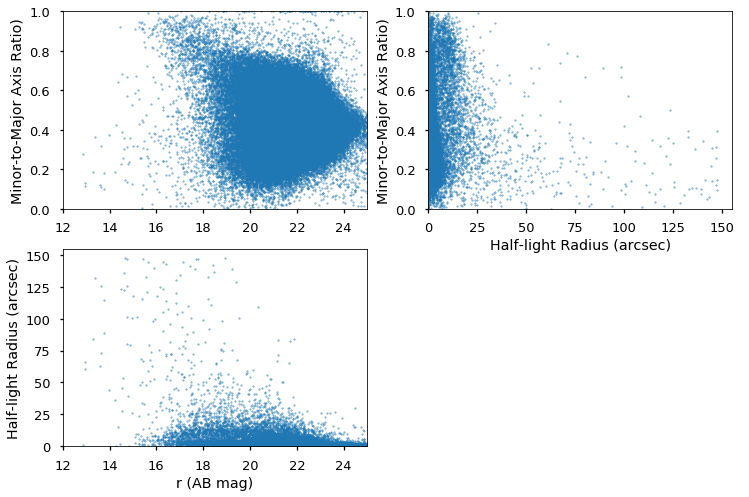

In [14]:
needles = get_needles(dr7)

In [15]:
needles

release,brickid,brickname,objid,brick_primary,brightstarinblob,type,ra,dec,ra_ivar,dec_ivar,bx,by,dchisq [5],ebv,mjd_min,mjd_max,ref_cat,ref_id,pmra,pmdec,parallax,pmra_ivar,pmdec_ivar,parallax_ivar,ref_epoch,gaia_pointsource,gaia_phot_g_mean_mag,gaia_phot_g_mean_flux_over_error,gaia_phot_g_n_obs,gaia_phot_bp_mean_mag,gaia_phot_bp_mean_flux_over_error,gaia_phot_bp_n_obs,gaia_phot_rp_mean_mag,gaia_phot_rp_mean_flux_over_error,gaia_phot_rp_n_obs,gaia_phot_variable_flag,gaia_astrometric_excess_noise,gaia_astrometric_excess_noise_sig,gaia_astrometric_n_obs_al,gaia_astrometric_n_good_obs_al,gaia_astrometric_weight_al,gaia_duplicated_source,flux_u,flux_g,flux_r,flux_i,flux_z,flux_y,flux_w1,flux_w2,flux_w3,flux_w4,flux_ivar_u,flux_ivar_g,flux_ivar_r,flux_ivar_i,flux_ivar_z,flux_ivar_y,flux_ivar_w1,flux_ivar_w2,flux_ivar_w3,flux_ivar_w4,apflux_u [8],apflux_g [8],apflux_r [8],apflux_i [8],apflux_z [8],apflux_y [8],apflux_resid_u [8],apflux_resid_g [8],apflux_resid_r [8],apflux_resid_i [8],apflux_resid_z [8],apflux_resid_y [8],apflux_ivar_u [8],apflux_ivar_g [8],apflux_ivar_r [8],apflux_ivar_i [8],apflux_ivar_z [8],apflux_ivar_y [8],mw_transmission_u,mw_transmission_g,mw_transmission_r,mw_transmission_i,mw_transmission_z,mw_transmission_y,mw_transmission_w1,mw_transmission_w2,mw_transmission_w3,mw_transmission_w4,nobs_u,nobs_g,nobs_r,nobs_i,nobs_z,nobs_y,nobs_w1,nobs_w2,nobs_w3,nobs_w4,rchisq_u,rchisq_g,rchisq_r,rchisq_i,rchisq_z,rchisq_y,rchisq_w1,rchisq_w2,rchisq_w3,rchisq_w4,fracflux_u,fracflux_g,fracflux_r,fracflux_i,fracflux_z,fracflux_y,fracflux_w1,fracflux_w2,fracflux_w3,fracflux_w4,fracmasked_u,fracmasked_g,fracmasked_r,fracmasked_i,fracmasked_z,fracmasked_y,fracin_u,fracin_g,fracin_r,fracin_i,fracin_z,fracin_y,anymask_u,anymask_g,anymask_r,anymask_i,anymask_z,anymask_y,allmask_u,allmask_g,allmask_r,allmask_i,allmask_z,allmask_y,wisemask_w1,wisemask_w2,psfsize_u,psfsize_g,psfsize_r,psfsize_i,psfsize_z,psfsize_y,psfdepth_u,psfdepth_g,psfdepth_r,psfdepth_i,psfdepth_z,psfdepth_y,galdepth_u,galdepth_g,galdepth_r,galdepth_i,galdepth_z,galdepth_y,wise_coadd_id,lc_flux_w1 [9],lc_flux_w2 [9],lc_flux_ivar_w1 [9],lc_flux_ivar_w2 [9],lc_nobs_w1 [9],lc_nobs_w2 [9],lc_fracflux_w1 [9],lc_fracflux_w2 [9],lc_rchisq_w1 [9],lc_rchisq_w2 [9],lc_mjd_w1 [9],lc_mjd_w2 [9],fracdev,fracdev_ivar,shapeexp_r,shapeexp_r_ivar,shapeexp_e1,shapeexp_e1_ivar,shapeexp_e2,shapeexp_e2_ivar,shapedev_r,shapedev_r_ivar,shapedev_e1,shapedev_e1_ivar,shapedev_e2,shapedev_e2_ivar
int16,int32,bytes8,int32,bool,bool,bytes4,float64,float64,float32,float32,float32,float32,float32,float32,float64,float64,bytes32,int64,float32,float32,float32,float32,float32,float32,float32,bool,float32,float32,int16,float32,float32,int16,float32,float32,int16,bool,float32,float32,int16,int16,float32,bool,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,uint8,uint8,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,bytes8,float32,float32,float32,float32,int16,int16,float32,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32
7000,360110,2407p050,3023,True,False,EXP,240.860011752,4.98619890883,1.2

In [16]:
def needle_cutouts(needles, nperrow=5): 
    baseurl = 'http://legacysurvey.org//viewer-dev/'
        
    nrow = np.ceil(len(needles) / nperrow).astype('int')
    jpgsplit = list()
    for ii in range(nrow):
        i1 = nperrow*ii
        i2 = nperrow*(ii+1)
        if i2 > len(needles):
            i2 = len(needles)
        jpgsplit.append(needles[i1:i2])
    print('Splitting the sample into {} rows with {} mosaics per row.'.format(nrow, nperrow))
    
    fig, ax = plt.subplots(nrow, nperrow, figsize=(3*nperrow, 3*nrow))
    
    ii = 0
    for jpgrow in jpgsplit:
        for obj in jpgrow:
            thisax = ax.flat[ii]
            url = '{}jpeg-cutout?ra={:.9f}1&dec={:.8f}&size=300&layer=decals-dr5'.format(
                baseurl, obj['ra'], obj['dec'])
            print('{}?ra={:.9f}1&dec={:.8f}&size=300&layer=decals-dr5'.format(
                baseurl, obj['ra'], obj['dec']))
            #print(url)
            
            img = skimage.io.imread(url)
            thisax.imshow(img)
            thisax.axis('off')
            ii += 1

Splitting the sample into 32 rows with 5 mosaics per row.
http://legacysurvey.org//viewer-dev/?ra=240.8600117521&dec=4.98619891&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.3833159721&dec=6.89802163&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.5288228641&dec=5.27915517&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.4845851101&dec=5.35113280&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.8999023041&dec=5.24751054&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.6407652961&dec=8.38435822&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.2586848601&dec=9.11768354&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.1102046791&dec=8.01307320&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=239.9478904901&dec=8.74912031&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=240.0353899701&dec=8.81212116&size=300

http://legacysurvey.org//viewer-dev/?ra=241.9055772401&dec=9.87251905&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.9119933061&dec=9.88604174&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.9127348501&dec=9.89792056&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.9198098821&dec=9.90651818&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.8908227241&dec=9.90721118&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.8920551281&dec=9.91289516&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=241.8747763691&dec=9.90780001&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=242.0342648061&dec=10.08592329&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=242.0345066041&dec=10.09120059&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?ra=242.0225694881&dec=10.07795386&size=300&layer=decals-dr5
http://legacysurvey.org//viewer-dev/?

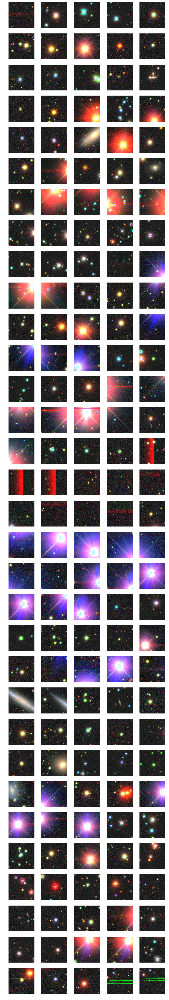

In [17]:
needle_cutouts(needles)